<a href="https://colab.research.google.com/github/OgunSerifOnargan/VBM-661---Data-Visualization/blob/main/VBM661_Final_Projesi_Ogun_Serif_Onargan_N22137400.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***ÖNEMLİ NOT:***
> Kod bloğunun çıktılar ile dosya büyüklüğü 11 mb'tır. 5mb yükleme sınırından dolayı çıktıları silinerek yükleme yapılmıştır. Kod bloğunun çalışma süresi yaklaşık 15 dakikadır. Dilerseniz aşağıdaki linkten çıktıların hazır haline ulaşabilirsiniz.



https://colab.research.google.com/drive/1xmeqm-KXCeFCpwXPmAWJmxdDRUIxPtbk?usp=sharing

Imports

In [ ]:
#@title
import pandas as pd
import numpy as np
import io
import matplotlib.pyplot as plt
import sys
from seaborn import violinplot, boxplot
import seaborn as sns
np.set_printoptions(threshold=sys.maxsize)
from google.colab import files
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings("ignore")
!pip install geopandas
import geopandas as gpd
from geopandas import GeoDataFrame
from matplotlib import cm 
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
!pip install bar_chart_race
import bar_chart_race as bcr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 19.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 KB 3.3 MB/s eta 0:00:00


Downloads

In [ ]:
#@title
url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-06-16/slave_routes.csv'
df = pd.read_csv(url,encoding="latin1")
url = "https://raw.githubusercontent.com/OgunSerifOnargan/VodoVest/main/worldcities.csv"
cities = pd.read_csv(url,encoding="latin1")

Data Preperation

In [ ]:
#@title
for i, val in enumerate(df["port_arrival"]):
  df.port_arrival[i] = str(val).split(',')[0]

for i, val in enumerate(df["port_arrival"]):
  df.port_arrival[i] = str(val).split('(')[0]

#@title
df["place_of_purchase"][df["place_of_purchase"]=='New Calabar'] = "Calabar"
df["place_of_purchase"][df["place_of_purchase"]=='Bight of Biafra and Gulf of Guinea Islands, port unspecified'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Bonny'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Congo River'] = "Congo (Brazzaville)"
df["place_of_purchase"][df["place_of_purchase"]=='Cape Mount (Cape Grand Mount)'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='West Central Africa and St. Helena, port unspecified'] = "Angola"
df["place_of_purchase"][df["place_of_purchase"]=="Africa., port unspecified"] = "Central African Republic"
df["place_of_purchase"][df["place_of_purchase"]=='Sierra Leone estuary'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Windward Coast (Nunez - Assini)'] = "Puerto Rico"
df["place_of_purchase"][df["place_of_purchase"]=='Cape Coast Castle'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Bight of Benin, port unspecified'] = "Benin"
df["place_of_purchase"][df["place_of_purchase"]=='Anomabu'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Gold Coast, port unspecified'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Lagos, Onim'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Gambia'] = "Australia"
df["place_of_purchase"][df["place_of_purchase"]=='Cameroons River'] = "Cameroon"
df["place_of_purchase"][df["place_of_purchase"]=='Whydah'] = "India"
df["place_of_purchase"][df["place_of_purchase"]=='Cameroons'] = "Cameroon"
df["place_of_purchase"][df["place_of_purchase"]=='Iles de Los'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Grenada Point'] = "Puerto Rico"
df["place_of_purchase"][df["place_of_purchase"]=='Goree'] = "Senegal"
df["place_of_purchase"][df["place_of_purchase"]=='Bassa'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Malembo'] = "Congo (Brazzaville)"
df["place_of_purchase"][df["place_of_purchase"]=='Banana Islands'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='River Brass'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Sao Tome'] = "Brazil"
df["place_of_purchase"][df["place_of_purchase"]=='Lourenco Marques'] = "Mozambique"
df["place_of_purchase"][df["place_of_purchase"]=='Windward Coast, port unspecified'] = "Puerto Rico"
df["place_of_purchase"][df["place_of_purchase"]=='Corisco'] = "Equatorial Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Gallinhas'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Princes Island'] = "Central African Republic"
df["place_of_purchase"][df["place_of_purchase"]=='Grand Sestos'] = "Argentina"
df["place_of_purchase"][df["place_of_purchase"]=='Quilimane'] = "Mozambique"
df["place_of_purchase"][df["place_of_purchase"]=='Sherbro'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Pongo'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Popo'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Cape Verde Islands'] = "Portugal"
df["place_of_purchase"][df["place_of_purchase"]=='Little Bassa'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Trade Town'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Grand Bassa'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Grand Mesurado'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Bights'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Cap Lopez'] = "Gabon"
df["place_of_purchase"][df["place_of_purchase"]=='Little Popo'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Nunez'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Jacquin'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Nun'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Bimbia'] = "Cameroon"
df["place_of_purchase"][df["place_of_purchase"]=='Sierra Leone, port unspecified'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Senegambia and offshore Atlantic, port unspecified'] = "Gambia"
df["place_of_purchase"][df["place_of_purchase"]=='Cape of Good Hope'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Bissagos'] = "Guinea-Bissau"
df["place_of_purchase"][df["place_of_purchase"]=='Badagry/Apa'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Nova Redonda'] = "Brazil"
df["place_of_purchase"][df["place_of_purchase"]=='Boary'] = "India"
df["place_of_purchase"][df["place_of_purchase"]=='Windward + Ivory + Gold + Benin'] = "Central African Republic"
df["place_of_purchase"][df["place_of_purchase"]=='Elmina'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Forcados'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Cape Lahou'] = "CÃ´te d'Ivoire"
df["place_of_purchase"][df["place_of_purchase"]=="Bance Island (Ben's Island)"] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Mpinda'] = "Angola"
df["place_of_purchase"][df["place_of_purchase"]=='Pokesoe (Princes Town)'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Cabo Lopo Goncalves'] = "Gabon"
df["place_of_purchase"][df["place_of_purchase"]=='Christiansborg'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Costa de Africa (mainland coast around S Tome/Principe)'] = "Gabon"
df["place_of_purchase"][df["place_of_purchase"]=='Southeast Africa and Indian Ocean islands, port unspecified'] = "Madagascar"
df["place_of_purchase"][df["place_of_purchase"]=='Alampo'] = "India"
df["place_of_purchase"][df["place_of_purchase"]=='Wiamba'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Cess'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Kilwa'] = "Kenya"
df["place_of_purchase"][df["place_of_purchase"]=='Costa da Mina'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Coanza River'] = "Angola"
df["place_of_purchase"][df["place_of_purchase"]=='Casamance'] = "Senegal"
df["place_of_purchase"][df["place_of_purchase"]=='Penido'] = "Brazil"
df["place_of_purchase"][df["place_of_purchase"]=='Alampo'] = "India"
df["place_of_purchase"][df["place_of_purchase"]=='Alampo'] = "India"
df["place_of_purchase"][df["place_of_purchase"]=='Gambia'] = "The Gambia"
df["place_of_purchase"][df["place_of_purchase"]=='Ardra'] = "India"
df["place_of_purchase"][df["place_of_purchase"]=='Soyo'] = "Angola"
df["place_of_purchase"][df["place_of_purchase"]=='Alampo'] = "India"
df["place_of_purchase"][df["place_of_purchase"]=='Ivory Coast'] = "CÃ´te d'Ivoire"
df["place_of_purchase"][df["place_of_purchase"]=='Portudal'] = "Senegal"
df["place_of_purchase"][df["place_of_purchase"]=='Arguim'] = "Mauritania"
df["place_of_purchase"][df["place_of_purchase"]=='River del Rey'] = "Cameroon"
df["place_of_purchase"][df["place_of_purchase"]=='Kormantine'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Congo North'] = "Congo (Kinshasa)"
df["place_of_purchase"][df["place_of_purchase"]=='Mano'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Momboza or Zanzibar'] = "Tanzania"
df["place_of_purchase"][df["place_of_purchase"]=='Cacandia'] = "Central African Republic"
df["place_of_purchase"][df["place_of_purchase"]=='Grand Bassam'] = "CÃ´te d'Ivoire"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Zaire'] = "Brazil"
df["place_of_purchase"][df["place_of_purchase"]=='Iles Plantain'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Kilongo'] = "Congo (Kinshasa)"
df["place_of_purchase"][df["place_of_purchase"]=='Ibo'] = "Chad"
df["place_of_purchase"][df["place_of_purchase"]=='Quirimba'] = "Mozambique"
df["place_of_purchase"][df["place_of_purchase"]=='Quicombo'] = "Angola"
df["place_of_purchase"][df["place_of_purchase"]=='Portuguese Guinea'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Costa Leste Occidental'] = "Ecuador"
df["place_of_purchase"][df["place_of_purchase"]=='Sofala'] = "Mozambique"
df["place_of_purchase"][df["place_of_purchase"]=='Senegambia or Sierra Leone'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Apollonia'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Galam'] = "Indonesia"
df["place_of_purchase"][df["place_of_purchase"]=='Sao Tome or Princes Island'] = "Gabon"
df["place_of_purchase"][df["place_of_purchase"]=='Ife'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Oere'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='West of Cape Apolonia'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Gold Coast from Kormatine to Accra'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Apammin'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Lay'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Grand Popo'] = "Benin"
df["place_of_purchase"][df["place_of_purchase"]=='Alecuba'] = "Cuba"
df["place_of_purchase"][df["place_of_purchase"]=='Gulf of Guinea islands'] = "Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='Amokou'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Princes Island and Elmina'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Albreda'] = "Gambia"
df["place_of_purchase"][df["place_of_purchase"]=='Axim'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Cote de Malaguette (runs through to Cape Palmas on Windward Coast)'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Cape Logas (location undetermined)'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='C.C. Castle and Windward'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Gold Coast east of Kormantine'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Assini'] = "CÃ´te d'Ivoire"
df["place_of_purchase"][df["place_of_purchase"]=='Ambona'] = "Madagascar"
df["place_of_purchase"][df["place_of_purchase"]=='Danish Gold Coast'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Gold Coast + Bight of Benin + Bight of Biafra'] = "CÃ´te d'Ivoire"
df["place_of_purchase"][df["place_of_purchase"]=='Cape Mole'] = "Ghana"
df["place_of_purchase"][df["place_of_purchase"]=='Quaqua'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Nazareth'] = "Brazil"
df["place_of_purchase"][df["place_of_purchase"]=='Mauritius (Ile de France)'] = "France"
df["place_of_purchase"][df["place_of_purchase"]=='Fernando Po'] = "Equatorial Guinea"
df["place_of_purchase"][df["place_of_purchase"]=='River Kissey'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Bilbay'] = "Egypt"
df["place_of_purchase"][df["place_of_purchase"]=='Tabou'] = "CÃ´te d'Ivoire"
df["place_of_purchase"][df["place_of_purchase"]=='Delagoa'] = "Mozambique"
df["place_of_purchase"][df["place_of_purchase"]=='Dembia'] = "Ethiopia"
df["place_of_purchase"][df["place_of_purchase"]=='Liverpool River'] = "Australia"
df["place_of_purchase"][df["place_of_purchase"]=='Settra Kru'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Gold Coast, Fr. definition'] = "Madagascar"
df["place_of_purchase"][df["place_of_purchase"]=='Petit Mesurado'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Scarcies'] = "Sierra Leone"
df["place_of_purchase"][df["place_of_purchase"]=='Joal, or Saloum River'] = "Senegal"
df["place_of_purchase"][df["place_of_purchase"]=='French Africa (Goree or Senegal)'] = "Senegal"
df["place_of_purchase"][df["place_of_purchase"]=='Andony'] = "Ecuador"
df["place_of_purchase"][df["place_of_purchase"]=='Asia e Africa, port unspecified'] = "Liberia"
df["place_of_purchase"][df["place_of_purchase"]=='Mascarene Islands'] = "Madagascar"
df["place_of_purchase"][df["place_of_purchase"]=='Eva'] = "South Africa"
df["place_of_purchase"][df["place_of_purchase"]=='Chama'] = "Mozambique"
df["place_of_purchase"][df["place_of_purchase"]=='Legas'] = "Nigeria"
df["place_of_purchase"][df["place_of_purchase"]=='Rio Dande (N of Luanda)'] = "Angola"
df["place_of_purchase"][df["place_of_purchase"]=='Mascarene Islands'] = "Madagascar"
df["place_of_purchase"][df["place_of_purchase"]=='St. Lawrence'] = "Puerto Rico"
df["place_of_purchase"][df["place_of_purchase"]=='Gambia'] = "The Gambia"
df["place_of_purchase"][df["place_of_purchase"]=='French Guiana'] = "Suriname"
df["place_of_purchase"][df["place_of_purchase"]=='Saint Barthelemy'] = "Puerto Rico"
df["place_of_purchase"][df["place_of_purchase"]=='Cabo Verde'] = "Portugal"
df["place_of_purchase"][df["place_of_purchase"]=='Guadeloupe'] = "Puerto Rico"

df["port_arrival"][df["port_arrival"]=='St. Vincent'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Demerara'] = "Guyana"
df["port_arrival"][df["port_arrival"]=='Cape Coast Castle'] = "Ghana"
df["port_arrival"][df["port_arrival"]=='St. Barthelemy'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Americas'] = "United States"
df["port_arrival"][df["port_arrival"]=='Pernambuco'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='St. Eustatius'] = "Saint Kitts And Nevis"
df["port_arrival"][df["port_arrival"]=='Saint John '] = "Canada"
df["port_arrival"][df["port_arrival"]=='USA'] = "United States"
df["port_arrival"][df["port_arrival"]=='Newcastle '] = "United Kingdom"
df["port_arrival"][df["port_arrival"]=='Rappahannock'] = "United States"
df["port_arrival"][df["port_arrival"]=='British Caribbean'] = "Saint Lucia"
df["port_arrival"][df["port_arrival"]=='Maryland'] = "United States"
df["port_arrival"][df["port_arrival"]=='York River'] = "United States"
df["port_arrival"][df["port_arrival"]=='Patuxent'] = "United States"
df["port_arrival"][df["port_arrival"]=='West Indies '] = "The Bahamas"
df["port_arrival"][df["port_arrival"]=='Bahia'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='St. Kitts'] = "Saint Kitts And Nevis"
df["port_arrival"][df["port_arrival"]=='Maranhao'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Africa.'] = "Central African Republic"
df["port_arrival"][df["port_arrival"]=='French Caribbean'] = "Martinique"
df["port_arrival"][df["port_arrival"]=='Curacao'] = "Venezuela"
df["port_arrival"][df["port_arrival"]=='Zion Hill'] = "Jamaica"
df["port_arrival"][df["port_arrival"]=='Essequibo'] = "Guyana"
df["port_arrival"][df["port_arrival"]=='Dutch Caribbean'] = "Venezuela"
df["port_arrival"][df["port_arrival"]=='Dutch Guianas'] = "Guyanas"
df["port_arrival"][df["port_arrival"]=='St. Lucia'] = "Trinidad and Tobago"
df["port_arrival"][df["port_arrival"]=='Antigua'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Tortola'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Guyanas'] = "Guyana"
df["port_arrival"][df["port_arrival"]=='St. Croix'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Spanish Caribbean'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Cayes '] = "Haiti"
df["port_arrival"][df["port_arrival"]=='Leogane'] = "Haiti"
df["port_arrival"][df["port_arrival"]=='Danish West Indies'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Upper James River'] = "United States"
df["port_arrival"][df["port_arrival"]=='Bight of Biafra and Gulf of Guinea Islands'] = "Guinea"
df["port_arrival"][df["port_arrival"]=='Savanna la Mar'] = "Jamaica"
df["port_arrival"][df["port_arrival"]=='Martha Brae'] = "Jamaica"
df["port_arrival"][df["port_arrival"]=='Falmouth '] = "United States"
df["port_arrival"][df["port_arrival"]=='Saint-Domingue'] = "Dominican Republic"
df["port_arrival"][df["port_arrival"]=='Spanish Americas'] = "Mexico"
df["port_arrival"][df["port_arrival"]=='Trinidad de Cuba'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Caribbean '] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Portobelo'] = "Panama"
df["port_arrival"][df["port_arrival"]=='Hispaniola'] = "Dominican Republic"
df["port_arrival"][df["port_arrival"]=='Sagua'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='New Spain'] = "Mexico"
df["port_arrival"][df["port_arrival"]=='San Domingo '] = "Dominican Republic"
df["port_arrival"][df["port_arrival"]=='Para'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Paraiba'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Canary Islands'] = "Spain"
df["port_arrival"][df["port_arrival"]=='Bahamas'] = "The Bahamas"
df["port_arrival"][df["port_arrival"]=='Jeremie'] = "Haiti"
df["port_arrival"][df["port_arrival"]=='Lucea '] = "Jamaica"
df["port_arrival"][df["port_arrival"]=='Bahia Honda'] = "United States"
df["port_arrival"][df["port_arrival"]=='Guanimar'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='South Carolina'] = "United States"
df["port_arrival"][df["port_arrival"]=='South Potomac'] = "United States"
df["port_arrival"][df["port_arrival"]=='Maceio'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Rio de Janeiro province'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Isla de Pinas'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Sao Sebastiao'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Macae'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Cape of Good Hope'] = "United States"
df["port_arrival"][df["port_arrival"]=='Berbice'] = "Guyana"
df["port_arrival"][df["port_arrival"]=="Saint Ann's Bay"] = "Jamaica"
df["port_arrival"][df["port_arrival"]=='Bonny'] = "Nigeria"
df["port_arrival"][df["port_arrival"]=='Petit-Goave'] = "Haiti"
df["port_arrival"][df["port_arrival"]=='Puerto Padre'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Cabanas'] = "El Salvador"
df["port_arrival"][df["port_arrival"]=='Lower James River'] = "United States"
df["port_arrival"][df["port_arrival"]=='Cardenas'] = "Mexico"
df["port_arrival"][df["port_arrival"]=='Canasi'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Dois Rios'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Magari'] = "United States"
df["port_arrival"][df["port_arrival"]=='Ilha Grande'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Ponta Negro'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Malembo'] = "Angola"
df["port_arrival"][df["port_arrival"]=='Tybee Island'] = "United States"
df["port_arrival"][df["port_arrival"]=='Cumana'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Spanish Circum-Caribbean'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Fort Dauphin'] = "Madagascar"
df["port_arrival"][df["port_arrival"]=='Marica'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Bissagos'] = "Guinea-Bissau"
df["port_arrival"][df["port_arrival"]=='Cumingsberg'] = "Suriname"
df["port_arrival"][df["port_arrival"]=='Alagoas province'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Rio Sao Jeso'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='St. Maarten'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Rio de la Hacha'] = "Colombia"
df["port_arrival"][df["port_arrival"]=='Samana'] = "Dominican Republic"
df["port_arrival"][df["port_arrival"]=='Louisiana'] = "United States"
df["port_arrival"][df["port_arrival"]=='Rio Grande do Sul Province'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Catuamo and Maria Farinha'] = "Chile"
df["port_arrival"][df["port_arrival"]=='San Juan de los Remedios'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Southeast Brazil'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Bacuranao'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='British Leewards'] = "Basseterre"
df["port_arrival"][df["port_arrival"]=='Nevis'] = "Saint Kitts And Nevis"
df["port_arrival"][df["port_arrival"]=='North Carolina'] = "United States"
df["port_arrival"][df["port_arrival"]=='Eastern New Jersey'] = "United States"
df["port_arrival"][df["port_arrival"]=='Mississippi'] = "United States"
df["port_arrival"][df["port_arrival"]=='Rhode Island'] = "United States"
df["port_arrival"][df["port_arrival"]=='Delaware River'] = "United States"
df["port_arrival"][df["port_arrival"]=='Goree'] = "Senegal"
df["port_arrival"][df["port_arrival"]=='Taipu'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Porto Seguro'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Paranagua'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Baia de Botafogo'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Ilha de Itamaric'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Porto de Galinhas'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Potomac river'] = "United States"
df["port_arrival"][df["port_arrival"]=='Londontowne'] = "United States"
df["port_arrival"][df["port_arrival"]=='Hamilton '] = "Bermuda"
df["port_arrival"][df["port_arrival"]=='British Americas'] = "United States"
df["port_arrival"][df["port_arrival"]=='Senegambia and offshore Atlantic'] = "The Gambia"
df["port_arrival"][df["port_arrival"]=='Mosquito Shore'] = "Nicaragua"
df["port_arrival"][df["port_arrival"]=='Rio de la Plata'] = "Argentina"
df["port_arrival"][df["port_arrival"]=='Ocoa'] = "Dominican Republic"
df["port_arrival"][df["port_arrival"]=='Tobago'] = "Trinidad And Tobago"
df["port_arrival"][df["port_arrival"]=='Fort-Royale'] = "Martinique"
df["port_arrival"][df["port_arrival"]=='Batabano'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='British Honduras'] = "Honduras"
df["port_arrival"][df["port_arrival"]=='Annotto Bay'] = "Jamaica"
df["port_arrival"][df["port_arrival"]=='Tortuga'] = "Haiti"
df["port_arrival"][df["port_arrival"]=='French Africa '] = "CÃ´te d'Ivoire"
df["port_arrival"][df["port_arrival"]=='La Balise'] = "France"
df["port_arrival"][df["port_arrival"]=='Amelia Island'] = "United States"
df["port_arrival"][df["port_arrival"]=='Arcahaie'] = "Haiti"
df["port_arrival"][df["port_arrival"]=='Cul-de-Sac'] = "France"
df["port_arrival"][df["port_arrival"]=='Cabo de Buzios'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Elmina'] = "Ghana"
df["port_arrival"][df["port_arrival"]=='Caribbean'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Monte Christi'] = "Dominican Republic"
df["port_arrival"][df["port_arrival"]=='Guiana'] = "French Guiana"
df["port_arrival"][df["port_arrival"]=='Kingston '] = "Canada"
df["port_arrival"][df["port_arrival"]=='Princes Island'] = "Central African Republic"
df["port_arrival"][df["port_arrival"]=='Caibarien'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='West Central Africa and St. Helena'] = "Angola"
df["port_arrival"][df["port_arrival"]=='Mole Saint Nicolas'] = "Haiti"
df["port_arrival"][df["port_arrival"]=='Piscataqua'] = "United States"
df["port_arrival"][df["port_arrival"]=='Fernando Po'] = "Equatorial Guinea"
df["port_arrival"][df["port_arrival"]=='Parati'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Matanzas province'] = "Cuba"
df["port_arrival"][df["port_arrival"]=='Santa Catarina'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Colonia de Sacramento'] = "Uruguay"
df["port_arrival"][df["port_arrival"]=='Ilha de Lobes'] = "Uruguay"
df["port_arrival"][df["port_arrival"]=='Ilha das Palmas'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Baia de Sepetiba'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Ilha de Paqueta'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Ilha de Marambaia'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Cap Francais'] = "Mauritius"
df["port_arrival"][df["port_arrival"]=='Mauritius '] = "Mauritius"
df["port_arrival"][df["port_arrival"]=='Cananeia'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Ile de France'] = "France"
df["port_arrival"][df["port_arrival"]=='Rio Pongo'] = "South Africa"
df["port_arrival"][df["port_arrival"]=='Rio Grande do Norte'] = "Brazil"
df["port_arrival"][df["port_arrival"]=='Cape Verde Islands'] = "Portugal"
df["port_arrival"][df["port_arrival"]=='Puerto de Plata'] = "Dominican Republic"
df["port_arrival"][df["port_arrival"]=='Sao Tome'] = "Gabon"
df["port_arrival"][df["port_arrival"]=='Antonia'] = "Gabon"
df["port_arrival"][df["port_arrival"]=='Borburata'] = "Venezuela"
df["port_arrival"][df["port_arrival"]=='Orinoko'] = "Venezuela"
df["port_arrival"][df["port_arrival"]=='Barbados'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Dominica'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Guadeloupe'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Grenada'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='French Guiana'] = "Suriname"
df["port_arrival"][df["port_arrival"]=='Saint Kitts And Nevis'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Montserrat'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Martinique'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Mauritius'] = "Madagascar"
df["port_arrival"][df["port_arrival"]=='Saint Barthelemy'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Guadeloupe'] = "Puerto Rico"
df["port_arrival"][df["port_arrival"]=='Cabo Verde'] = "Portugal"

#@title
departure = df["place_of_purchase"].unique()
city_list = cities["city"].unique()
country_list = cities["country"].unique()
df_final = pd.DataFrame()
for i, val in enumerate(departure):
  df_aCity = df[df["place_of_purchase"]==val]
  df_cityList = cities[(cities["city"]==val) | (cities["country"]==val)]

  if (val in city_list) | (val in country_list):
    df_aCity["depart_city"] = df_cityList["city"].values[0]
    df_aCity["depart_country"] = df_cityList["country"].values[0]
    df_aCity["depart_lat"] = df_cityList["lat"].values[0]
    df_aCity["depart_lng"] = df_cityList["lng"].values[0]
    df_aCity["depart_iso3"] = df_cityList["iso3"].values[0]

  df_final = pd.concat([df_final, df_aCity], axis=0)

#@title
arrival = df_final["port_arrival"].unique()
city_list = cities["city"].unique()
country_list = cities["country"].unique()
df_final2 = pd.DataFrame()
for i, val in enumerate(arrival):
  df_aCity = df_final[df_final["port_arrival"]==val]
  df_cityList = cities[(cities["city"]==val) | (cities["country"]==val)]

  if (val in city_list) | (val in country_list):
    df_aCity["arr_city"] = df_cityList["city"].values[0]
    df_aCity["arr_country"] = df_cityList["country"].values[0]
    df_aCity["arr_lat"] = df_cityList["lat"].values[0]
    df_aCity["arr_lng"] = df_cityList["lng"].values[0]
    df_aCity["arr_iso3"] = df_cityList["iso3"].values[0]

  df_final2 = pd.concat([df_final2, df_aCity], axis=0)

df_final2["depart_region"] = np.nan
df_final2["depart_region"][df_final2["depart_country"]=="Nigeria"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Guinea"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Congo (Brazzaville)"] = "Central Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Liberia"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Angola"] = "Central Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Central African Republic"] = "Central Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Saint Vincent And The Grenadines"] = "Carribean"
df_final2["depart_region"][df_final2["depart_country"]=="Sierra Leone"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Ghana"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Benin"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Cameroon"] = "Central Africa"
df_final2["depart_region"][df_final2["depart_country"]=="India"] = "Asia"
df_final2["depart_region"][df_final2["depart_country"]=="Cabo Verde"] = "Europe"
df_final2["depart_region"][df_final2["depart_country"]=="Gabon"] = "Central Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Senegal"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="South Africa"] = "Southern Africa"
df_final2["depart_region"][df_final2["depart_country"]=="CÃ´te d'Ivoire"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Egypt"] = "Northern Africa"
df_final2["depart_region"][df_final2["depart_country"]=="The Gambia"] = "Western Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Madagascar"] = "Southern Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Congo (Kinshasa)"] = "Central Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Argentina"] = "South America"
df_final2["depart_region"][df_final2["depart_country"]=="Brazil"] = "South America"
df_final2["depart_region"][df_final2["depart_country"]=="Mozambique"] = "Southern Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Equatorial Guinea"] = "Central Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Ethiopia"] = "Eastern Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Ecuador"] = "South America"
df_final2["depart_region"][df_final2["depart_country"]=="United States"] = "North America"
df_final2["depart_region"][df_final2["depart_country"]=="Cuba"] = "Caribbean"
df_final2["depart_region"][df_final2["depart_country"]=="Kenya"] = "Eastern Africa"
df_final2["depart_region"][df_final2["depart_country"]=="Tanzania"] = "Eastern Africa"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="BLM"] = "PRI"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="CPV"] = "PRT"
df_final2["depart_iso3"][df_final2["depart_iso3"]=="CPV"] = "PRT"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="GLP"] = "PRI"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="KNA"] = "PRT"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="LCA"] = "PRT"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="LCA"] = "PRT"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="LCA"] = "PRT"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="GUF"] = "TTO"
df_final2["arr_iso3"][df_final2["arr_iso3"]=="GEO"] = "USA"


df_final2["arr_decade"] = (df_final2["year_arrival"]/10).astype("int")*10
df_final2.dropna(inplace=True)
df_final2.reset_index(inplace=True)

New Dataset Creation

In [ ]:
#@title
list_depart_country = df_final2["depart_country"].unique()
list_arr_country = df_final2["arr_country"].unique()
list_country = np.concatenate((list_depart_country, list_arr_country))
list_country = np.unique(list_country)

list_depart_country_iso3 = df_final2["depart_iso3"].unique()
list_arr_country_iso3 = df_final2["arr_iso3"].unique()
list_country_iso3 = np.concatenate((list_depart_country_iso3, list_arr_country_iso3))
list_country_iso3 = np.unique(list_country_iso3)

df_depart_country_iso3 = pd.DataFrame(index=range(1530,1870,1), columns=list_country_iso3)
for i, val in enumerate(df_final2["depart_iso3"].unique()):
  temp = df_final2[df_final2["depart_iso3"]==val].groupby("year_arrival")["n_slaves_arrived"].sum()
  df_depart_country_iso3[val] = -temp
df_depart_country_iso3.fillna(0, inplace=True)
df_depart_cum_sum = df_depart_country_iso3.cumsum(axis=0)

df_arr_country_iso3 = pd.DataFrame(index=range(1530,1870,1), columns=list_country_iso3)
for i, val in enumerate(df_final2["arr_iso3"].unique()):
  temp = df_final2[df_final2["arr_iso3"]==val].groupby("year_arrival")["n_slaves_arrived"].sum()
  df_arr_country_iso3[val] = temp
df_arr_country_iso3.fillna(0, inplace=True)
df_arr_cum_sum = df_arr_country_iso3.cumsum(axis=0)

df_total_cum_sum = df_depart_cum_sum.add(df_arr_cum_sum)

1) 

In [ ]:
#@title
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

summary = df_total_cum_sum.tail(1)
summary = summary.T
world.set_index("iso_a3", inplace=True)
summary = pd.merge(
    left=summary,
    right=world,
    left_on=summary.index,
    right_on=world.index,
    how="left"
)
summary = GeoDataFrame(summary)



---


**Giriş**

> Coğrafi keşifler ile birlikte keşfedilen bölgelerin yeraltı ve yerüstü kaynakları kaşif ülkelere büyük fırsatlar yaratmıştır. Bu kaynakların işlenebilmesi için kısa sürede fazlasıyla iş gücüne ihtiyaç duyulmuş, iş gücü ihtiyacının karşılanabilmesi için ise ana kıta olarak isimlendirilen Avrupa, Afrika ve Asya kıtalarından yeni dünyaya göçler başlamıştır. Göçün isteğe bağlı olmayan hali olan köle ticareti ise bu dönemde ivmelenerek artmıştır. Köle ticaretinin hacmi 1806 yılında ilk olarak İngiltere tarafından imzalanan Köle Ticareti Yasası ile düşüşe geçmiş ve 1850'li yıllarda legal köle ticareti son bulmuştur.


Text(0.5, 0.98, 'Slave Trade Timeline By Regions')

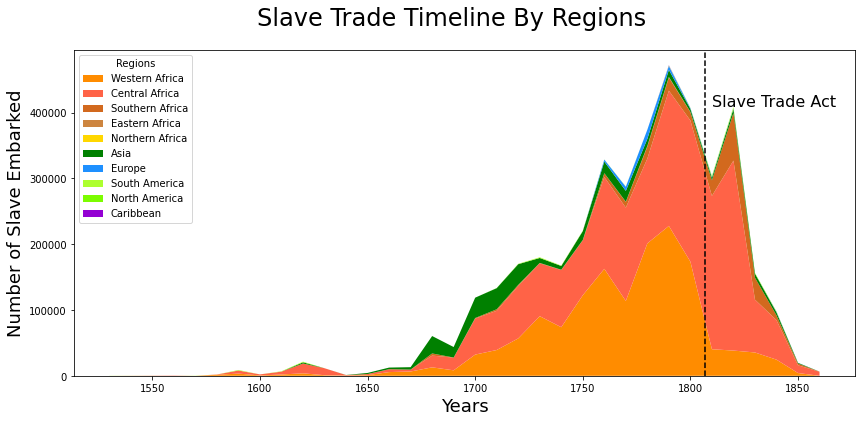

In [ ]:
#@title
df_1 = df_final2.set_index("arr_decade")
d_r = df_1["depart_region"].unique()
df_region = pd.DataFrame(index= df_1.index.sort_values(ascending=True).unique(), columns=[d_r])

for i, val in enumerate(d_r):
  temp = df_1[df_1["depart_region"]==val].groupby("arr_decade")["n_slaves_arrived"].sum()
  df_region[val] = temp
df_region.fillna(0, inplace=True)

fig, ax =plt.subplots(figsize=(14,6))
ax.stackplot(df_region.index,df_region["Western Africa"].values.ravel(),
              df_region["Central Africa"].values.ravel(),
              df_region["Southern Africa"].values.ravel(),
              df_region["Eastern Africa"].values.ravel(),
              df_region["Northern Africa"].values.ravel(),
              df_region["Asia"].values.ravel(),
              df_region["Europe"].values.ravel(),
              df_region["South America"].values.ravel(),
              df_region["North America"].values.ravel(),
              df_region["Caribbean"].values.ravel(),       
              labels=["Western Africa",
                      "Central Africa",
                      "Southern Africa",
                      "Eastern Africa",
                      "Northern Africa",
                      "Asia",
                      "Europe",
                      "South America",
                      "North America",
                      "Caribbean"],
             colors=["darkorange", "tomato", "chocolate", "peru", "gold","green","dodgerblue","greenyellow","lawngreen","darkviolet"])
handles=["Western Africa",
                      "Central Africa",
                      "Southern Africa",
                      "Eastern Africa",
                      "Northern Africa",
                      "Asia",
                      "Europe",
                      "South America",
                      "North America",
                      "Caribbean"]
ax.legend(handles, loc="upper left", title="Regions")

plt.axvline(x = 1807, color = 'black', label = 'axvline - full height', linestyle="dashed")
plt.text(1810, 410000, 'Slave Trade Act', fontsize = 16)
plt.xlabel("Years", fontsize=18)
plt.ylabel("Number of Slave Embarked", fontsize=18)
fig.suptitle("Slave Trade Timeline By Regions", fontsize=24)

**Grafik 1:**
*   x ekseni: Yıl (1530-1870) Sıralı Veri, Temporal
*   y ekseni: Gemiye Bindirilmiş Köle Sayısı: Nümerik Veri
*   Renk: Bölgeler, Kategorik Veri

**Soru 1:**
> 1530 - 1870 yılları arasında köle ticareti hangi dönemlerde ivmelenmiş ve bu dönemlerde hangi bölgelerden kaynak sağlanmıştır?



**Cevap 1:**
> Köle ticareti 1650-1700 yılları arasında ivmelenmeye başlamış ve ilk olarak İngiltere'de yürürlüğe konulan Köle Ticareti Yasağı'nın birkaç yıl içerisinde hemen hemen tüm sömürgeci ülkelerde uygulanması ile birlikte 1850 yılına kadar hızlı bir şekilde düşüş göstermiştir.


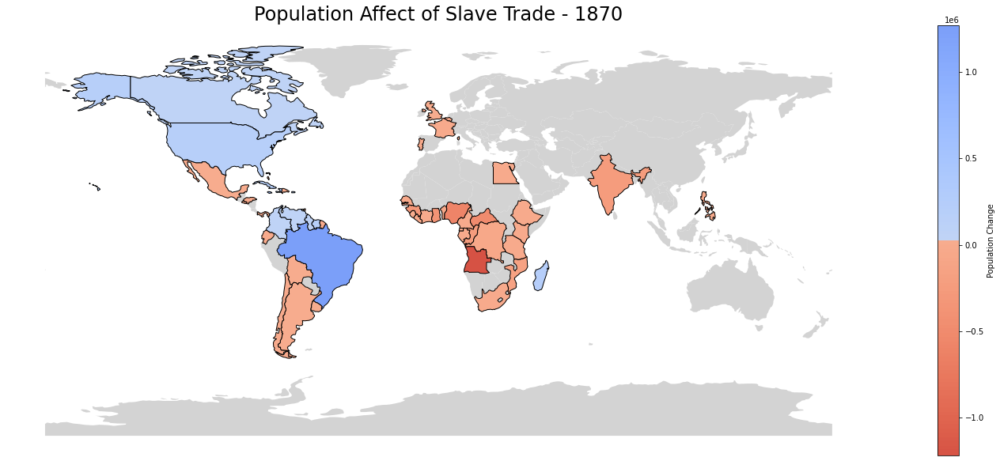

In [ ]:
#@title
a=np.linspace(0.1, 0.3, 128)
b=np.linspace(0.6, 0.8, 128)
c=np.concatenate((a,b))
hsv_modified = cm.get_cmap('coolwarm_r', 256)
newcmp = ListedColormap(hsv_modified(c))

fig, ax = plt.subplots(figsize=(30,10))
world.plot(ax=ax, color="lightgrey")
summary.plot(ax=ax, column=summary.columns[1], cmap=newcmp,edgecolor="black", legend=True, legend_kwds={'label': "Population Change"})
ax.axis("off")
plt.title("Population Affect of Slave Trade - 1870", fontsize=24)
plt.show()

**Grafik 2:**
*   x ekseni: Logitude (Boylam), Nümerik Veri
*   y ekseni: Latitude (Enlem), Nümerik Veri
*   Renk: Köle alınan ve teslim edilen Bölgelerin Nüfusundaki Toplam Değişim, Nümerik Veri





**Soru 2:** 
> Kolonicilik doktrinini benimseyen ülkeler köle ticaretini dünyanın hangi bölgeler arasında gerçekleştirmişlerdir?



**Cevap 2:** 
> Kölelerin çoğu Benin Körfezi olarak da bilinen batı afrika bölgesi ve Hint Okyanusu Köle Ticareti Bölgesi olarak bilinen Hindistan bölgesinden alınmıştır. Köle ticaretinin akışı başta Brezilya olmak üzere Amerika, Kanada ve Fransa sömürge bölgesi olan Madagaskar ve çevre adalarına doğru gerçekleşmiştir. Ayrıca başlıca sömürgeci ülkelerden olan İngiltere, Fransa ve Portekiz ana topraklarına köleleri sokmamış, tam tersine yeni dünya topraklarına göç vermişlerdir.




In [ ]:
#@title
list_depart_country = df_final2["depart_country"].unique()
list_arr_country = df_final2["arr_country"].unique()
list_country = np.concatenate((list_depart_country, list_arr_country))
list_country = np.unique(list_country)

list_depart_country = df_final2["depart_country"].unique()
list_arr_country = df_final2["arr_country"].unique()
list_country = np.concatenate((list_depart_country, list_arr_country))
list_country = np.unique(list_country)

df_depart_country = pd.DataFrame(index=range(1530,1870,1), columns=list_country)
for i, val in enumerate(df_final2["depart_country"].unique()):
  temp = df_final2[df_final2["depart_country"]==val].groupby("year_arrival")["n_slaves_arrived"].sum()
  df_depart_country[val] = -temp
df_depart_country.fillna(0, inplace=True)
df_depart_cum_sum_country = df_depart_country.cumsum(axis=0)

df_arr_country = pd.DataFrame(index=range(1530,1870,1), columns=list_country)
for i, val in enumerate(df_final2["arr_country"].unique()):
  temp = df_final2[df_final2["arr_country"]==val].groupby("year_arrival")["n_slaves_arrived"].sum()
  df_arr_country[val] = temp
df_arr_country.fillna(0, inplace=True)
df_arr_cum_sum_country = df_arr_country.cumsum(axis=0)

df_total_cum_sum_country = df_depart_cum_sum_country.add(df_arr_cum_sum_country)

In [ ]:
#@title
bcr.bar_chart_race(df=df_arr_cum_sum_country[50:], 
                   filename=None, 
                   figsize=(8,3.5), 
                   title="Number of Slaves - Arrival Countries of Slave Trade", 
                   n_bars=10, 
                   label_bars=True, 
                   bar_size=0.95,
                   period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Total Slave Embarked: {v.nlargest(20).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Helvetica'},
                   period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
                   period_fmt='Year: {x:.0f}',
                   period_length=500,
                   cmap='tab20c',
                   )

**Grafik 3**


*   x ekseni: Toplam Teslim Edilen Köle Sayısı, nümerik veri
*   y ekseni: Köle Teslim Alan Ülkeler, kategorik veri
*   Animasyon İlerletici: Yıl, sıralı veri
*   Toplam Gemiye Bindirilen Köle Sayısı, nümerik veri









**Soru 3:** 
> Hangi yüzyıllarda hangi ülkeler toplamda en çok köle ticaretine maruz kalmıştır ve bu köleler hangi ülkelere gönderilmiştir?



**Cevap 3-1:** 
>  17. yüzyılın son dönemlerine kadar köle ticaretinin İspanya kolonisi olan Kolombiya, Meksika ve Porto Riko topraklarına doğru olduğu gözlemlenmektedir. 17. yüzyılın son dönemlerinde ve 18. yüzyılda İngiliz sömürgesi olan Jamaika ve Kuzey Amerika topraklarının köle ticaretinden pay aldığı görülmektedir. 18. yüzyılın ortalarına gelindiğinde ise Portekiz sömürgesi olan Brezilya'nın köle ticaretini üzerine çekmektedir. Toplam rakamlara bakıldığında Brezilya, Jamaika, Porto Riko-Haiti (Karayipler) bölgelerinin sırasıyla Portekiz, İngiltere ve İspanya'nın köle ticareti gemilerinin ilk durağı ve dolayısıyla köle dağıtım merkezleri olduğu öngörülmektedir.


In [ ]:
#@title
df_depart_cum_sum_country1 = df_depart_cum_sum_country * -1
bcr.bar_chart_race(df=df_depart_cum_sum_country1[50:], 
                   filename=None, 
                   figsize=(8,3.5), 
                   title="Number of Slaves - Departure Countries of Slave Trade",
                   n_bars=10, 
                   label_bars=True, 
                   bar_size=0.95,
                   period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Total Slave Embarked: {v.nlargest(20).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Helvetica'},
                   period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
                   period_length=500,
                   cmap='tab20b',
                   period_fmt='Year: {x:.0f}',
                   )

**Grafik 4**
*    x - ekseni: Ülkelerden Alınan Köle Sayısı, nümerik veri
*    y - ekseni: Kölelerin Alındığı Ülkeler, kategorik veri
*    Animasyon ilerletici: Yıl, sıralı veri
*    Toplam Gemiye Bindirilen Köle Sayısı, nümerik veri  









**Cevap 3-2:**


> 17. yüzyılda ilk köle kaynağı olan Angola, Gambiya, Brezilya ve Gine toprakları Portekiz kolonisiydi. 17. yüzyılın sonlarına doğru ise Hint Köle Ticaret Bölgesinin etkin olduğu söylenebilir. 18. yüzyılın ilk çeyreğinde Orta Afrika bölgesinin de kolonileştirildiği ve bu bölgede köle ticaretinin hızlandığı söylenebilir. 18. yüzyılın ikinci yarısında ise İngiliz kolonisi olan Nijerya köle kaynağı olarak kullanılmıştır. Portekiz köle ticaretinden en geç vazgeçen ülke olarak 1836 yılında yasaklamış ve dünyadaki kayıtlı köle ticareti de 1836'da kısmi olarak sonlanmıştır.

**Sonuç**
> 20. yüzyıla kadar legal olarak dünyada varolan kölelik, 16. yüzyılda başlayan kolonizasyon akımı ile ülkelerin üretim gücü için fazlasıyla önem kazanımış ve 18. yüzyılın sonlarında tepe noktasına ulaşmıştır. Köleler kendi ülkelerinde istihdam edildiği gibi, yerel nüfusun kısıtlı olmasından dolayı köle akışının yönü kolonileştirilen Afrika ve Hindistan gibi bölgelerden iş gücünün fazlasıyla ihtiyaç duyulduğu Amerika kıtasına doğru da gerçekleşmiştir. 1806 yılında İngiltere tarafından imzalanan ve diğer ülkelere kabul ettirilen Köle Ticareti Yasağı ile köle ticareti hızlı bir şekilde azalmış ve 1836 yılında Portekiz'in de köleliği yasaklaması ile son bulmuştur.





> Ogün Şerif Onargan

> N22137400

> 15.01.2023